## ***0. GPU selection***

In [1]:
import os

GPU_ID = "0"
os.environ["CUDA_VISIBLE_DEVICES"] = GPU_ID
print(f"CUDA_VISIBLE_DEVICES = {os.environ['CUDA_VISIBLE_DEVICES']}")


CUDA_VISIBLE_DEVICES = 0


## ***1. Setup — base helpers***

In [2]:
import os
import glob
import sys
import warnings
from collections.abc import Mapping, Sequence
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline
from cycler import cycler
from PIL import Image

warnings.filterwarnings("ignore")

PALETTE = [
    "#0072B2", "#E69F00", "#009E73", "#D55E00",
    "#CC79A7", "#56B4E9", "#F0E442", "#999999",
]

mpl.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "savefig.bbox": "tight",
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.prop_cycle": cycler(color=PALETTE),
    "font.family": "DejaVu Sans",
})


def finish(suptitle: "str | None" = None) -> None:
    if suptitle:
        plt.gcf().suptitle(suptitle, fontsize=14, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.show()


SOURCE_ROOT = "/mnt/HDD6/longpm/railway/data_exp2/8/source"
TARGET_ROOT = "/mnt/HDD6/longpm/railway/data_exp2/8/target"
COMBINED_ROOT = "/mnt/HDD6/longpm/railway/data_exp2/8/combined"
CLASS_NAMES = ['fastener_1', 'critical_crack', 'fastener_2', 'sleeper_l', 'sleeper_r', 'missing_items', 'broken_sleeper', 'minor_crack']
SPLITS = ["Train", "Val", "Test"]
IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp")


class DatasetLayout:
    """Resolves directories for one dataset root, tolerant to Train/train casing."""

    def __init__(self, root: str, splits: Sequence[str] = tuple(SPLITS)) -> None:
        self.root = root
        self.splits = tuple(splits)

    def split_dir(self, split: str) -> str:
        for name in (split, split.lower(), split.capitalize()):
            candidate = os.path.join(self.root, name)
            if os.path.isdir(candidate):
                return candidate
        return os.path.join(self.root, split.lower())

    def images_dir(self, split: str) -> str:
        return os.path.join(self.split_dir(split), "images")

    def labels_dir(self, split: str) -> str:
        return os.path.join(self.split_dir(split), "labels")


def list_images(folder: str, image_exts: Sequence[str] = IMG_EXTS) -> "list[str]":
    matches: "list[str]" = []
    for ext in image_exts:
        matches += glob.glob(os.path.join(folder, "**", "*" + ext), recursive=True)
        matches += glob.glob(os.path.join(folder, "**", "*" + ext.upper()), recursive=True)
    return sorted(set(matches))


def class_color_map(class_names: Sequence[str], palette: Sequence[str]) -> "dict[str, str]":
    return {name: palette[i % len(palette)] for i, name in enumerate(class_names)}


LAYOUTS = {
    name: DatasetLayout(root, SPLITS)
    for name, root in {"source": SOURCE_ROOT, "target": TARGET_ROOT, "combined": COMBINED_ROOT}.items()
    if os.path.isdir(root)
}
CLASS_COLOR = class_color_map(CLASS_NAMES, PALETTE)

print("layouts :", list(LAYOUTS))
print("classes :", len(CLASS_NAMES))


layouts : ['source', 'target', 'combined']
classes : 8


## ***2. Build exp3 detector***

In [3]:
import torch
import yaml

DAINET_ROOT = "/home/longpm/works/projects/railway-uda/ralight"
for _path in (os.path.join(DAINET_ROOT, "src"), os.path.join(DAINET_ROOT, "src", "models")):
    if _path not in sys.path:
        sys.path.insert(0, _path)

from data.config import cfg as railight_cfg
from models.factory import build_net


def load_experiment_config(config_path: str) -> dict:
    with open(config_path) as handle:
        return yaml.safe_load(handle) or {}


def build_detector(config: Mapping[str, object], device: str) -> torch.nn.Module:
    railight_cfg.NUM_CLASSES = int(config["nc"]) + 1
    net = build_net(
        "train", railight_cfg.NUM_CLASSES,
        backbone=str(config["backbone"]), architecture=str(config["architecture"]),
    )
    state = torch.load(str(config["weights"]), map_location="cpu", weights_only=False)
    if isinstance(state, dict) and "weight" in state:
        state = state["weight"]
    net.load_state_dict(state)
    net.eval()
    return net.to(device)


EXP3_CONFIG = os.path.join(DAINET_ROOT, "configs/test/railight/vgg16/exp3.yaml")
exp3 = load_experiment_config(EXP3_CONFIG)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
detector = build_detector(exp3, DEVICE)

print(f"config  : {EXP3_CONFIG}")
print(f"weights : {exp3['weights']}")
print(f"device  : {DEVICE}  |  classes: {exp3['nc']}")


config  : /home/longpm/works/projects/railway-uda/ralight/configs/test/railight/vgg16/exp3.yaml
weights : /mnt/HDD6/longpm/railway/data_exp2/railight/weights/railight/vgg16/exp3/best_model.pth
device  : cuda  |  classes: 8


## ***3. Per-image prediction steps (exp3)***

## ***3. Per-image prediction steps — day vs night (exp3)***

Picks the **brightest** image from the source `Test` split (day domain) and the **darkest** image from the target `Test` split (night domain), then runs every step for both. Each step shows a single result image.

In [4]:
from matplotlib.patches import Rectangle

from models.enhancer import RetinexNet
from utils.augmentations import preprocess
from utils.night_synth import NightProfile, build_night_batch
from utils.predict import _decode_predictions, decode_image_instances
from utils.visualize import GradCAM, _overlay_heatmap

import matplotlib
matplotlib.use("module://matplotlib_inline.backend_inline")

RETINEX_WEIGHTS_PATH = "/mnt/HDD6/longpm/railway/data_exp2/dai-net/weights/decomp.pth"
STEP_SPLIT = "Test"
CAM_LAYER_INDEX = 28
REF_CAM_LAYER_INDEX = 0
CAM_ALPHA = 0.5
NIGHT_PROFILE = NightProfile()
NIGHT_SEED = 43


def load_retinex(weights_path: str, device: str) -> torch.nn.Module:
    net = RetinexNet()
    if os.path.isfile(weights_path):
        net.load_state_dict(torch.load(weights_path, map_location="cpu", weights_only=False))
    else:
        print(f"[WARN] {weights_path} missing - DecomNet is untrained")
    net.eval()
    return net.to(device)


def load_sample(image_path: str, device: str) -> "tuple[torch.Tensor, np.ndarray]":
    with Image.open(image_path) as handle:
        pixels, _ = preprocess(handle.convert("RGB"), [], "val", image_path)
    tensor = torch.from_numpy(pixels).unsqueeze(0).to(device) / 255.0
    raw = np.transpose(pixels, (1, 2, 0)).clip(0, 255).astype(np.uint8)
    return tensor, raw


def to_display(batch: torch.Tensor, index: int = 0) -> np.ndarray:
    array = batch[index].detach().float().cpu().numpy()
    if array.shape[0] == 1:
        array = np.repeat(array, 3, axis=0)
    return (np.transpose(array, (1, 2, 0)) * 255.0).clip(0, 255).astype(np.uint8)


def mean_luma(image_path: str, thumb: int = 64) -> float:
    with Image.open(image_path) as handle:
        gray = handle.convert("L").resize((thumb, thumb))
    return float(np.asarray(gray).mean())


def pick_extreme_luma(
    image_paths: Sequence[str], brightest: bool, sample: int = 400, seed: int = 43
) -> "tuple[float, str]":
    rng = np.random.default_rng(seed)
    chosen = rng.choice(len(image_paths), size=min(sample, len(image_paths)), replace=False)
    scored = sorted(
        ((mean_luma(image_paths[int(i)]), image_paths[int(i)]) for i in chosen),
        key=lambda item: item[0],
    )
    return scored[-1] if brightest else scored[0]


retinex_net = load_retinex(RETINEX_WEIGHTS_PATH, DEVICE)
SOURCE_IMAGES = list_images(LAYOUTS["source"].images_dir(STEP_SPLIT))
TARGET_IMAGES = list_images(LAYOUTS["target"].images_dir(STEP_SPLIT))
DAY_LUMA, DAY_PATH = pick_extreme_luma(SOURCE_IMAGES, brightest=True)
NIGHT_LUMA, NIGHT_PATH = pick_extreme_luma(TARGET_IMAGES, brightest=False)
day_tensor, day_raw = load_sample(DAY_PATH, DEVICE)
night_tensor, night_raw = load_sample(NIGHT_PATH, DEVICE)

print(f"day   : luma={DAY_LUMA:5.1f}  {DAY_PATH}")
print(f"night : luma={NIGHT_LUMA:5.1f}  {NIGHT_PATH}")
print(f"cam layer : vgg[{CAM_LAYER_INDEX}] -> {detector.vgg[CAM_LAYER_INDEX]}")
print(f"ref layer : ref[{REF_CAM_LAYER_INDEX}] -> {detector.ref[REF_CAM_LAYER_INDEX]}")

[WARN] /mnt/HDD6/longpm/railway/data_exp2/dai-net/weights/decomp.pth missing - DecomNet is untrained


day   : luma=149.3  /mnt/HDD6/longpm/railway/data_exp2/8/source/test/images/output_20324.png
night : luma= 63.4  /mnt/HDD6/longpm/railway/data_exp2/8/target/test/images/GX030357_043200.jpg
cam layer : vgg[28] -> Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
ref layer : ref[0] -> Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


In [5]:
def overlay_heatmap(
    base_image: np.ndarray, cam01: np.ndarray, alpha: float = 0.5, cmap: str = "inferno"
) -> np.ndarray:
    import cv2

    height, width = base_image.shape[:2]
    cam = np.asarray(cam01, dtype=np.float32)
    if cam.shape != (height, width):
        cam = cv2.resize(cam, (width, height), interpolation=cv2.INTER_LINEAR)
    colored = plt.get_cmap(cmap)(np.clip(cam, 0.0, 1.0))[..., :3] * 255.0
    return (alpha * colored + (1.0 - alpha) * base_image).clip(0, 255).astype(np.uint8)


def show_image(image: np.ndarray, size: float = 7.5) -> None:
    fig, ax = plt.subplots(figsize=(size, size))
    fig.patch.set_facecolor("white")
    ax.imshow(image)
    ax.axis("off")
    finish()


def step_input(raw: np.ndarray) -> None:
    show_image(raw)


def step_night(
    tensor: torch.Tensor,
    profile: NightProfile = NIGHT_PROFILE,
    seed: "int | None" = NIGHT_SEED,
) -> torch.Tensor:
    with torch.no_grad():
        night = build_night_batch(tensor, profile, seed)
    show_image(to_display(night))
    return night


def step_retinex(tensor: torch.Tensor) -> None:
    with torch.no_grad():
        reflectance, illumination = retinex_net(tensor)
    show_image(to_display(reflectance))
    show_image(to_display(illumination))

def step_detector_reflectance(
    tensor: torch.Tensor, base_image: np.ndarray,
    layer_index: int = REF_CAM_LAYER_INDEX, alpha: float = CAM_ALPHA,
) -> None:
    engine = GradCAM(detector, detector.ref[layer_index])
    try:
        cam = engine(
            tensor.detach().clone().requires_grad_(True),
            score_fn=lambda reflectance: reflectance.mean(),
            forward_fn=lambda model, x: model.reflectance(x),
        )
    finally:
        engine.remove()
    cam2d = cam[0] if np.ndim(cam) == 3 else cam
    show_image(overlay_heatmap(base_image, cam2d, alpha, cmap="inferno"))


def step_gradcam(
    tensor: torch.Tensor, base_image: np.ndarray,
    layer_index: int = CAM_LAYER_INDEX, alpha: float = CAM_ALPHA,
) -> None:
    engine = GradCAM(detector, detector.vgg[layer_index])
    try:
        cam = engine(
            tensor.detach().clone().requires_grad_(True),
            score_fn=lambda output: output[..., 1:].amax(dim=-1)
            .topk(min(30, output.shape[1])).values.sum(),
            forward_fn=lambda model, x: model.test_forward(x)[0][4],
        )
    finally:
        engine.remove()
    cam2d = cam[0] if np.ndim(cam) == 3 else cam
    overlay = overlay_heatmap(base_image, cam2d, alpha, cmap="inferno")
    show_image(overlay)

In [6]:
def step_predictions(
    tensor: torch.Tensor,
    base_image: np.ndarray,
    class_names: Sequence[str],
    class_colors: Mapping[str, str],
    score_threshold: float,
    nms_iou_threshold: float,
    size: float = 8.0,
) -> pd.DataFrame:
    with torch.no_grad():
        output, _ = detector.test_forward(tensor)
        decoded = _decode_predictions(detector, output).cpu().numpy()
    height, width = base_image.shape[:2]
    scale = np.array([width, height, width, height], dtype=np.float32)
    boxes, scores, labels = decode_image_instances(
        decoded[0], score_threshold, nms_iou_threshold, scale=scale
    )
    fig, ax = plt.subplots(figsize=(size, size))
    fig.patch.set_facecolor("white")
    ax.imshow(base_image)
    rows = []
    for (x1, y1, x2, y2), score, label in zip(boxes, scores, labels):
        name = (
            class_names[int(label) - 1]
            if 1 <= int(label) <= len(class_names) else f"id_{int(label)}"
        )
        color = class_colors.get(name, "#D55E00")
        ax.add_patch(Rectangle(
            (x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor=color, linewidth=2.4
        ))
        ax.text(
            x1, max(y1 - 6.0, 10.0), f"{name} {float(score):.2f}",
            fontsize=10, fontweight="bold", color="white",
            bbox=dict(facecolor=color, edgecolor="none", pad=1.6),
        )
        rows.append({"class": name, "score": round(float(score), 4),
                     "x1": round(float(x1), 1), "y1": round(float(y1), 1),
                     "x2": round(float(x2), 1), "y2": round(float(y2), 1)})
    ax.axis("off")
    finish()
    return pd.DataFrame(rows)

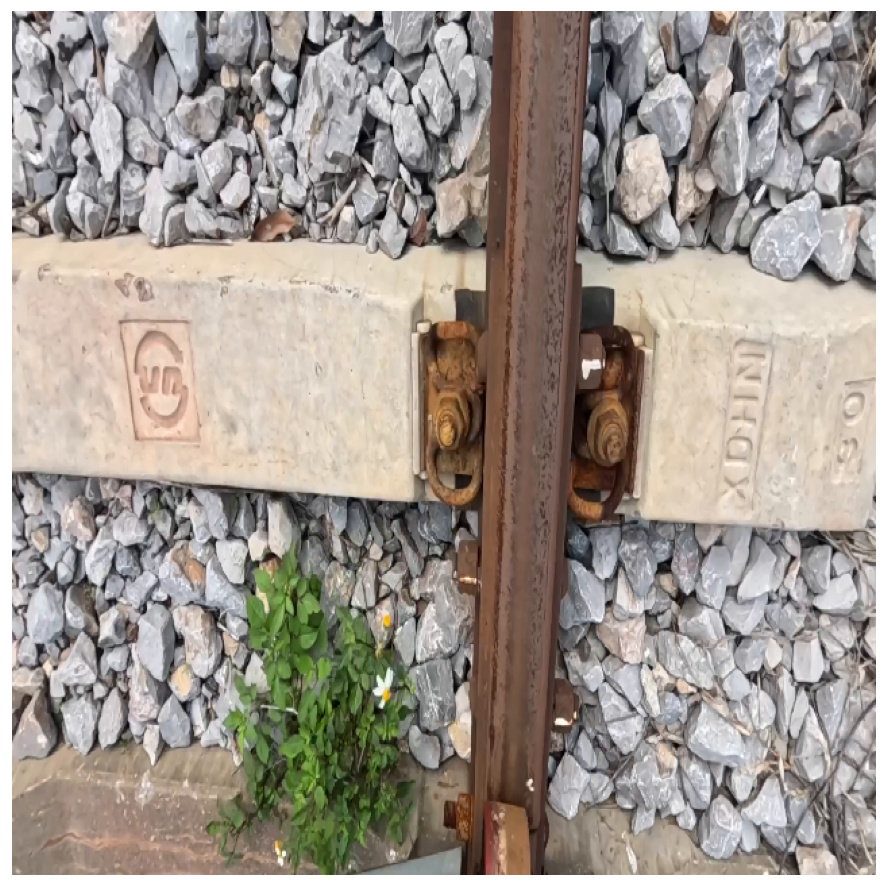

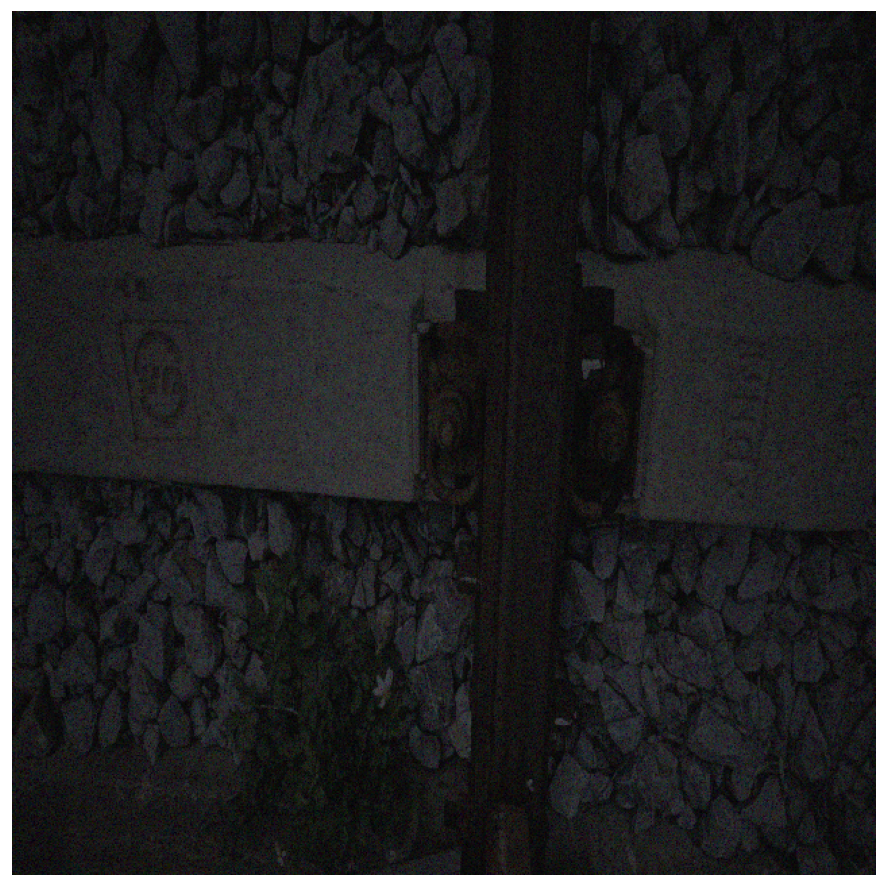

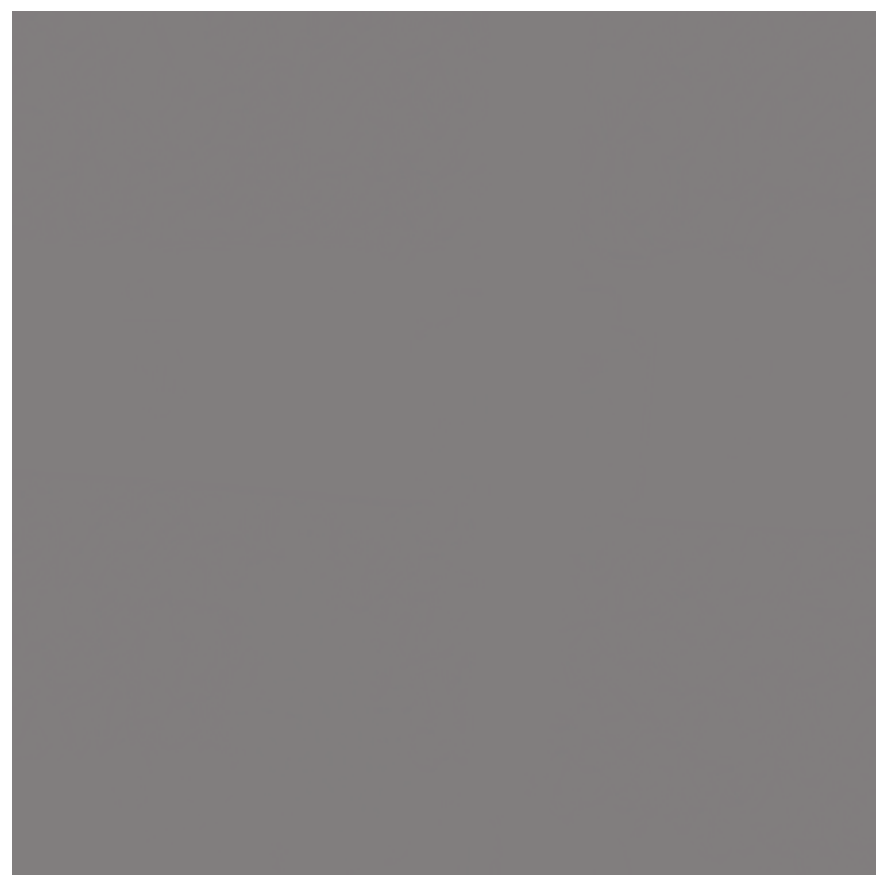

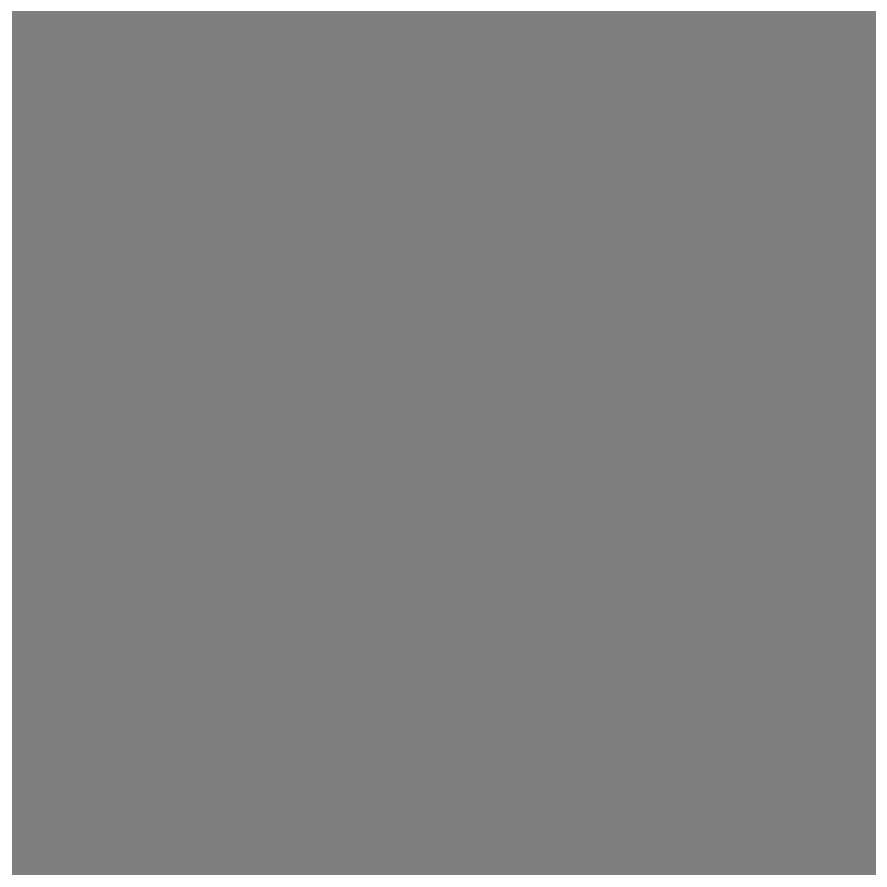

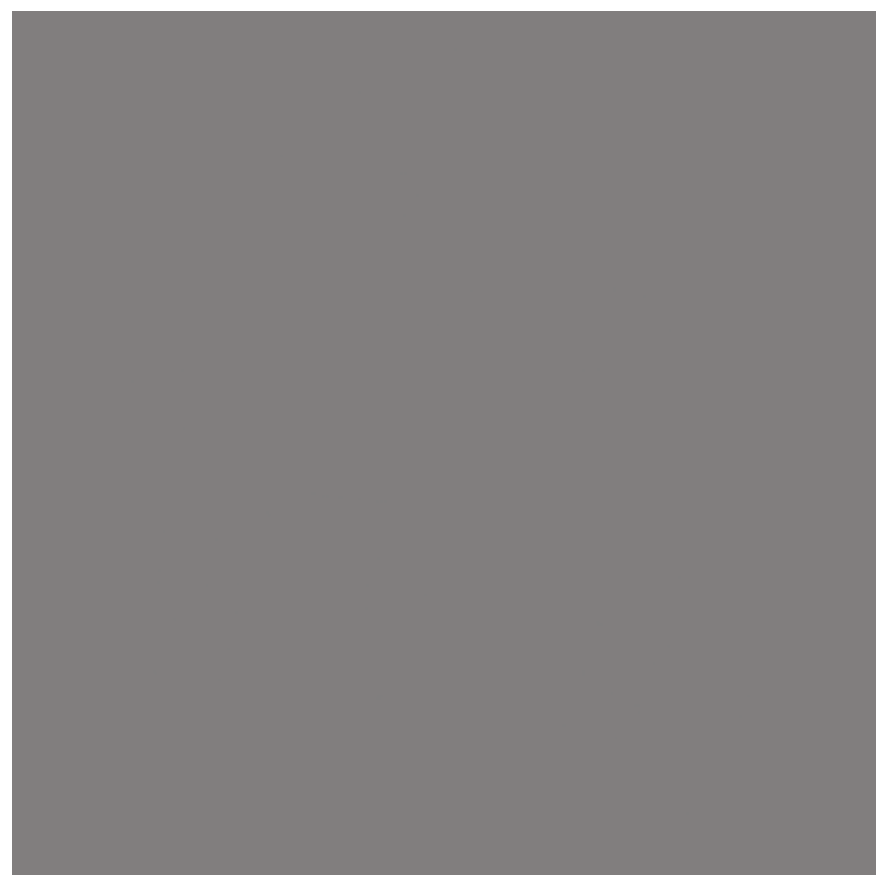

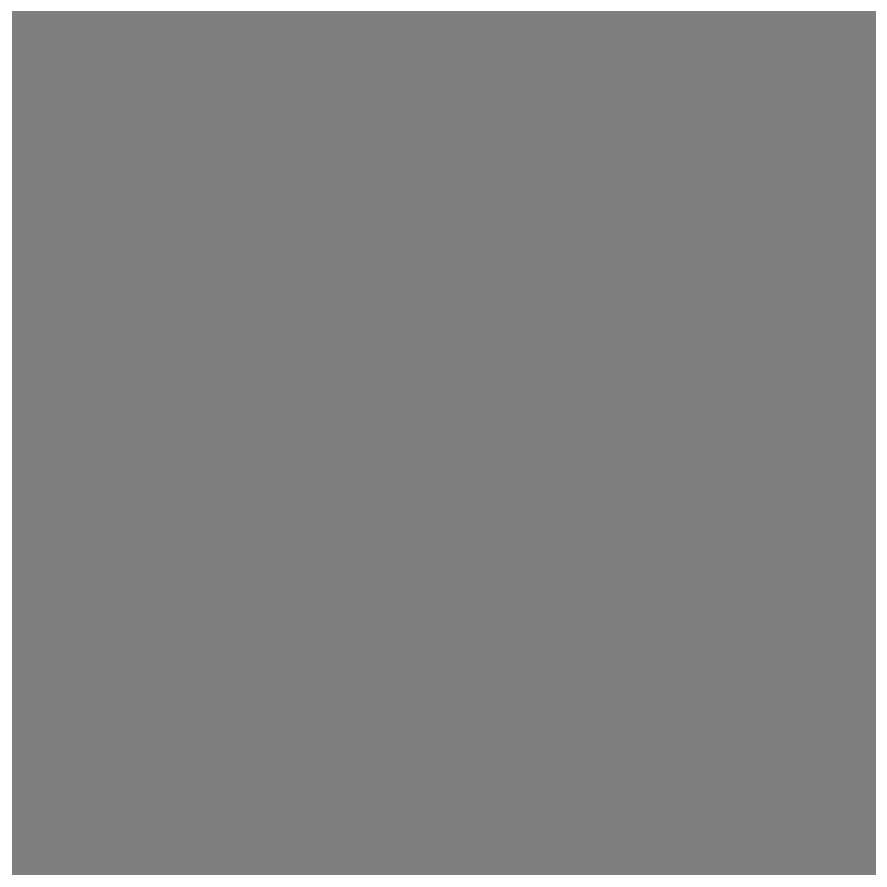

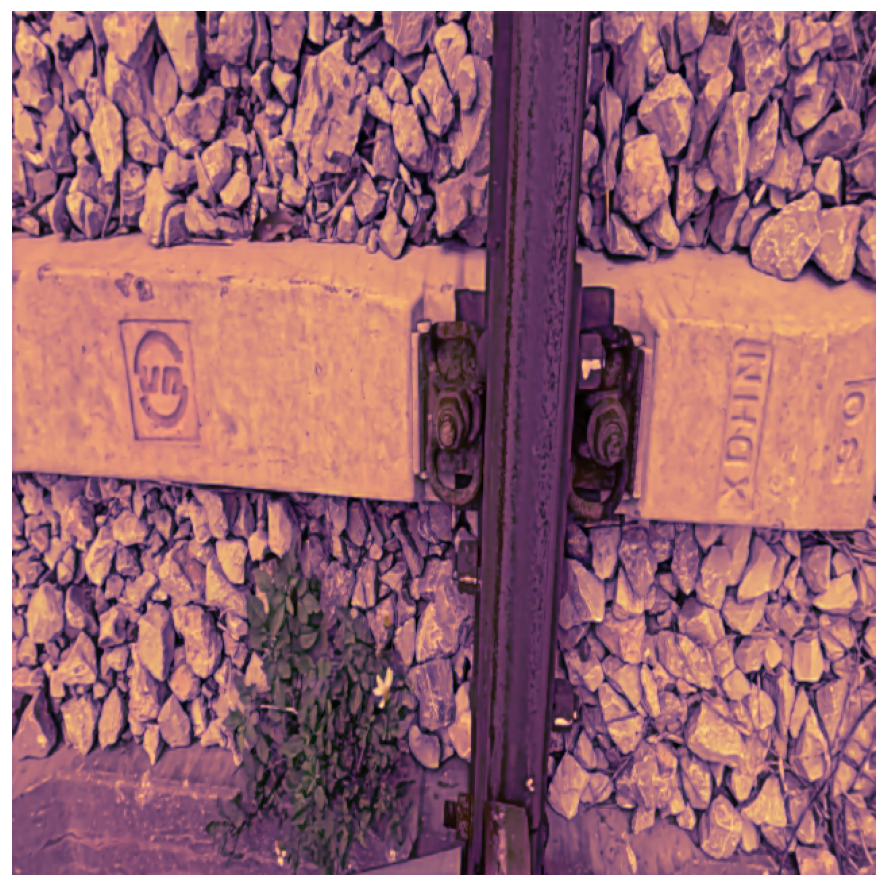

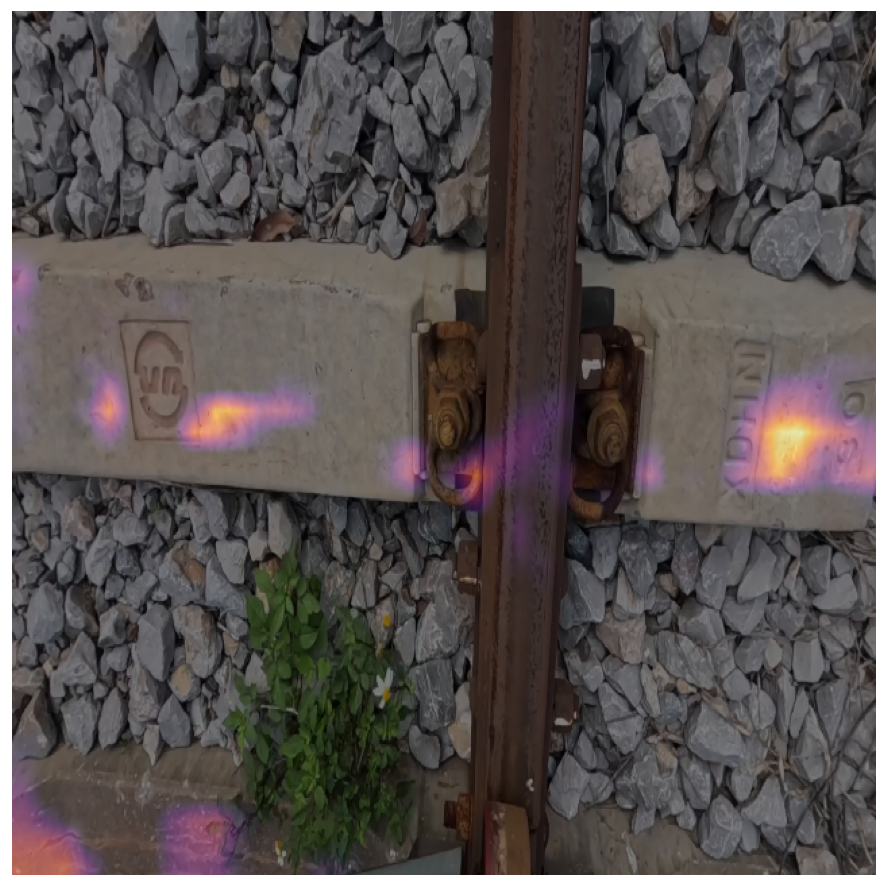

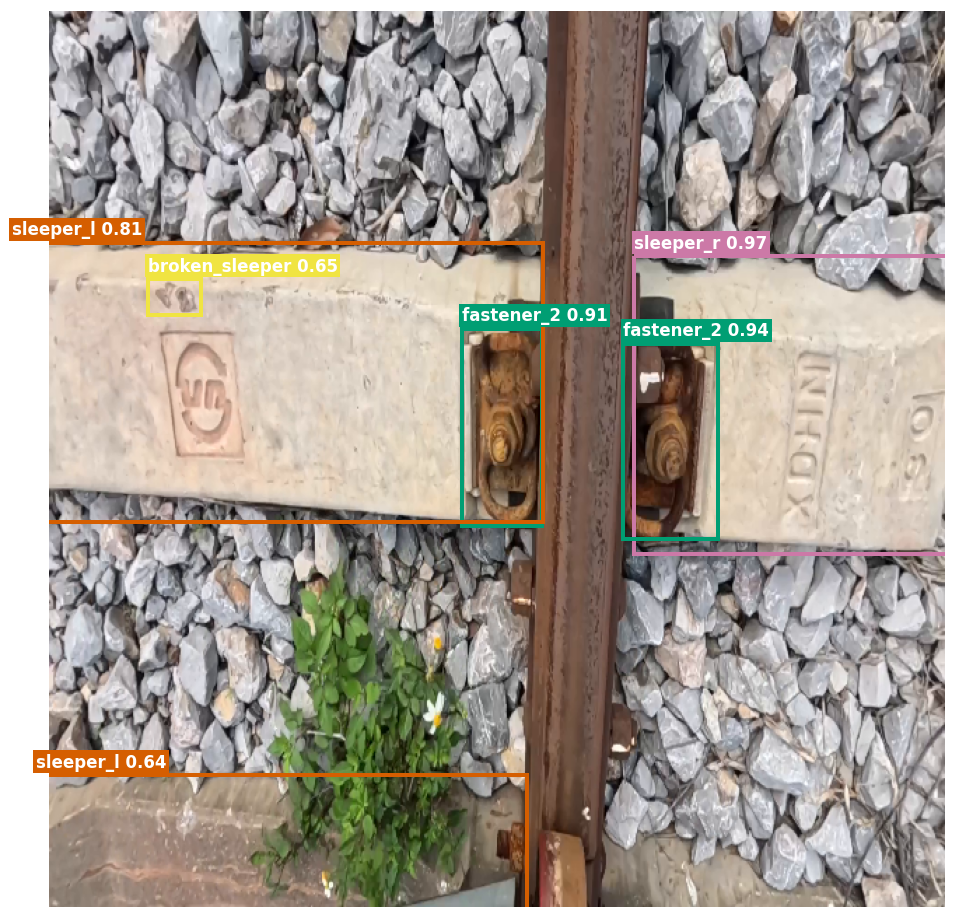

,class,score,x1,y1,x2,y2
0,sleeper_r,0.9741,417.8,174.6,650.7,387.5
1,fastener_2,0.9405,409.9,237.1,477.2,377.0
2,fastener_2,0.9115,294.6,226.5,351.8,367.2
3,sleeper_l,0.8123,-26.8,165.0,352.3,364.7
4,broken_sleeper,0.6520,70.0,190.9,108.4,217.0
5,sleeper_l,0.6440,-10.0,545.2,340.7,646.0


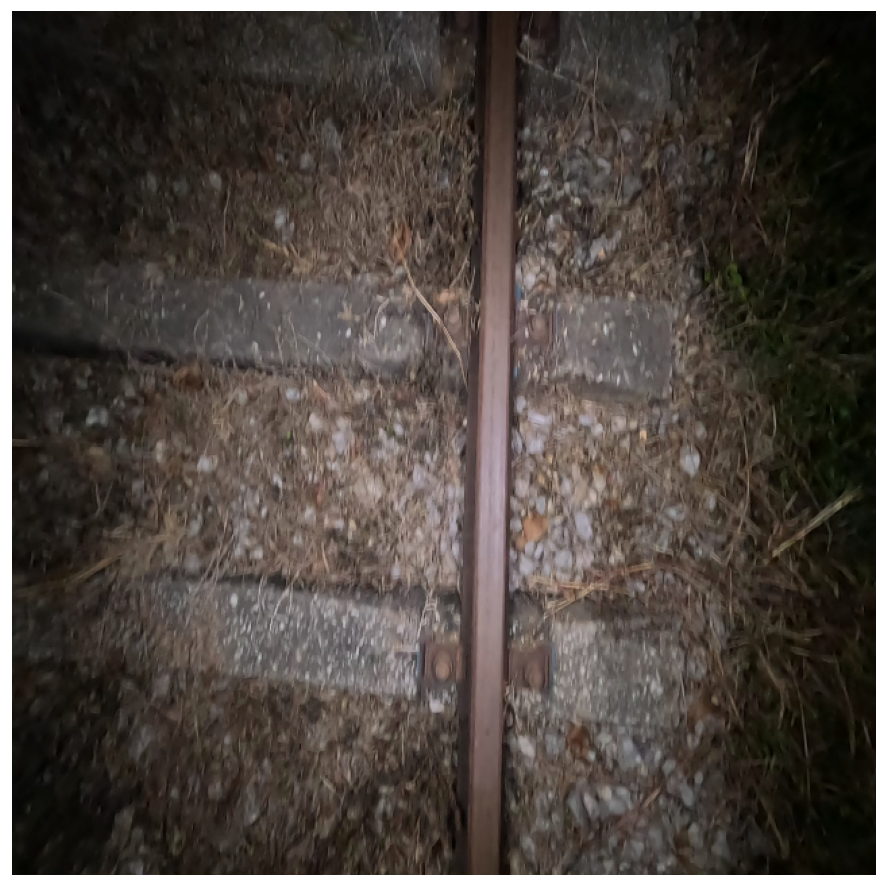

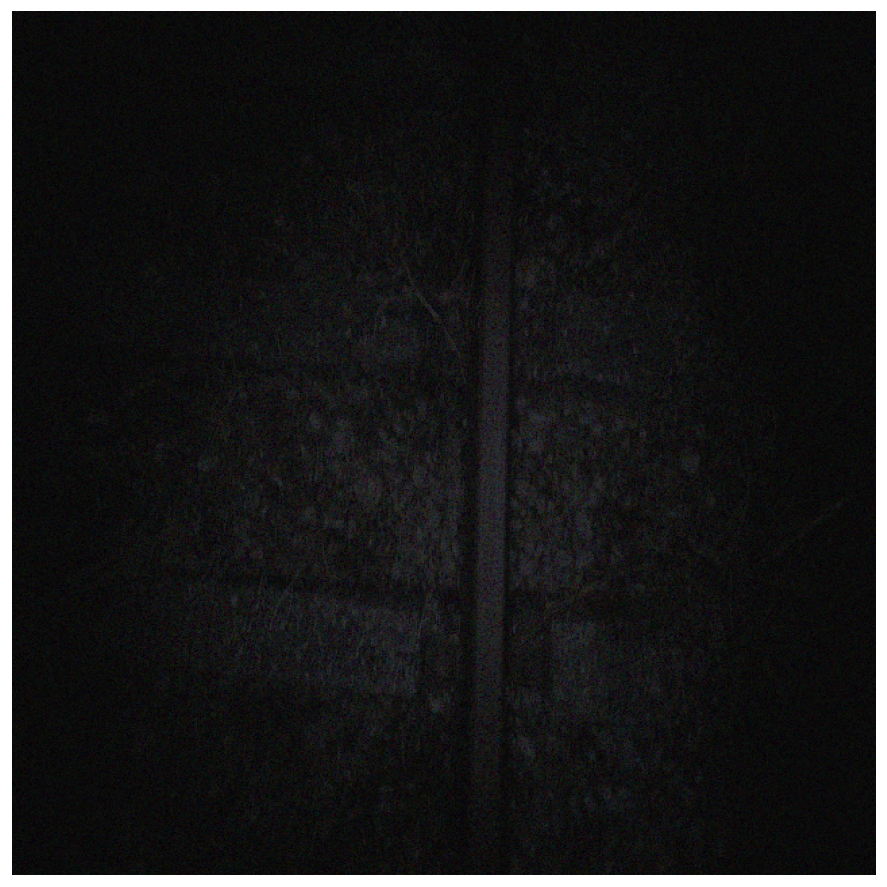

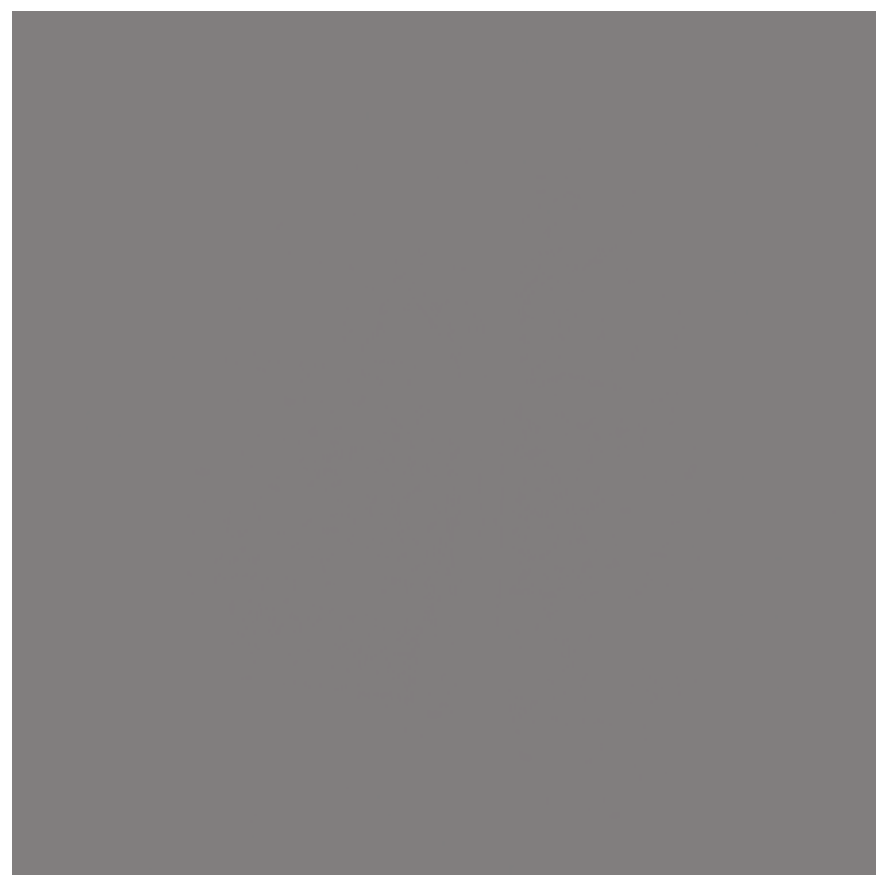

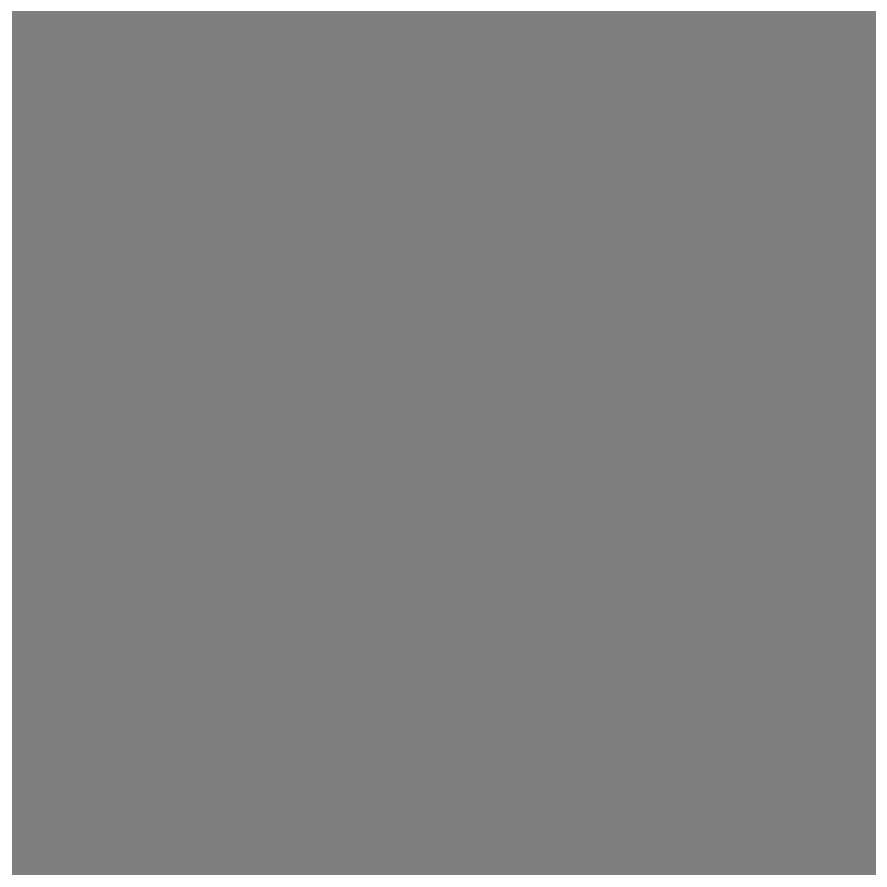

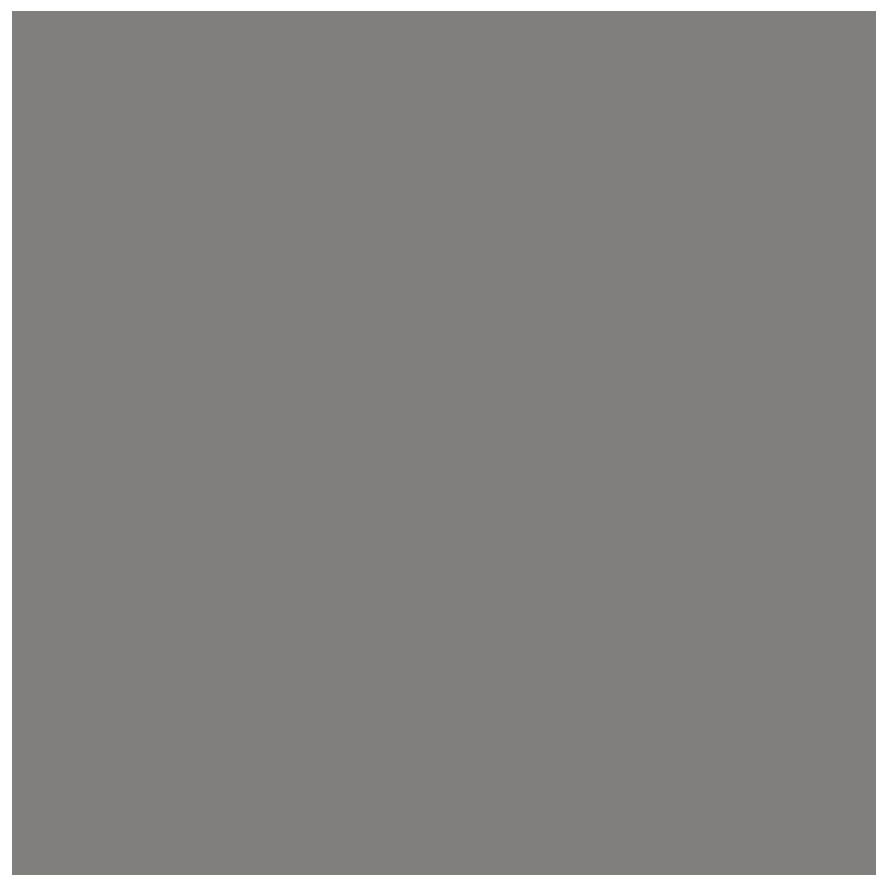

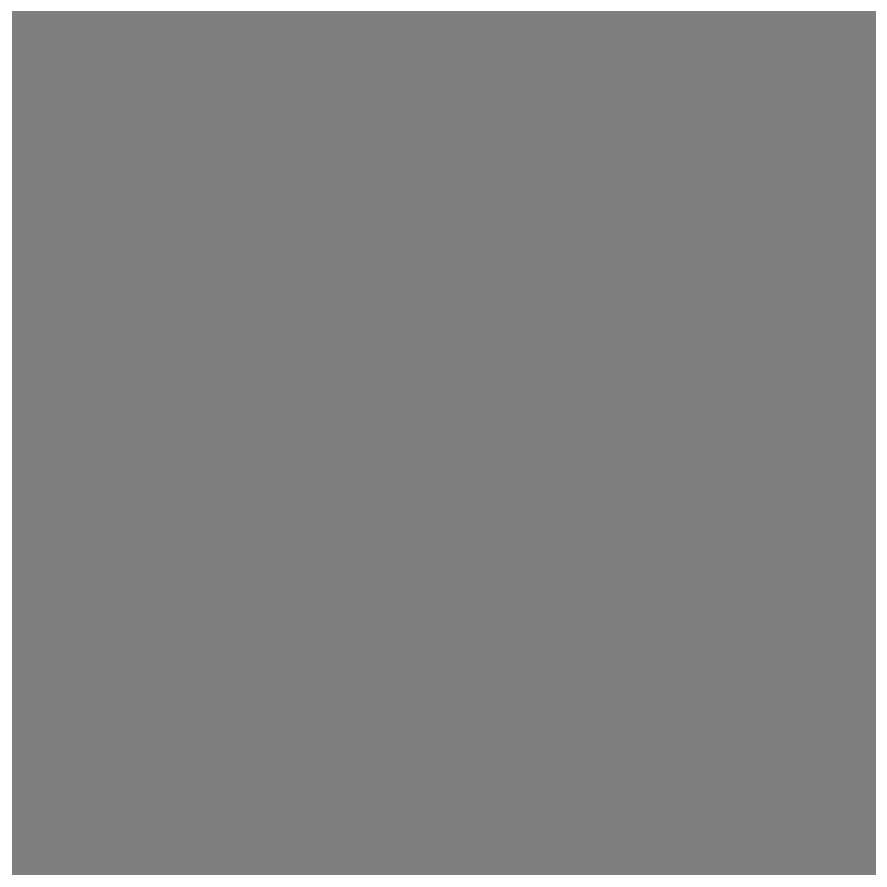

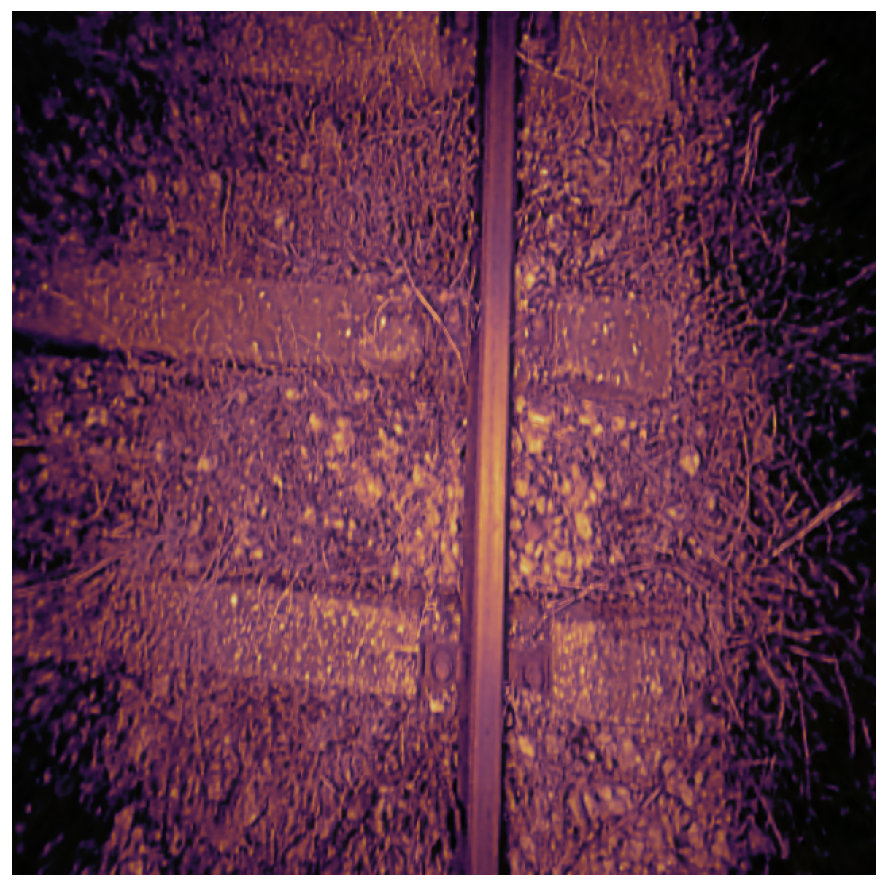

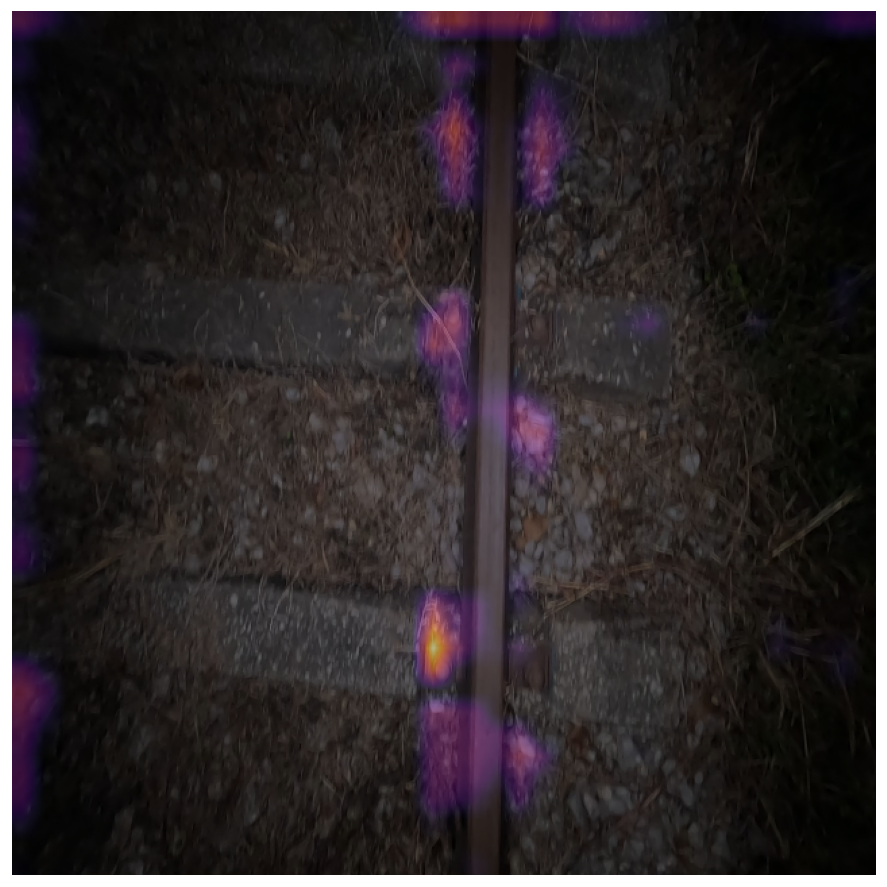

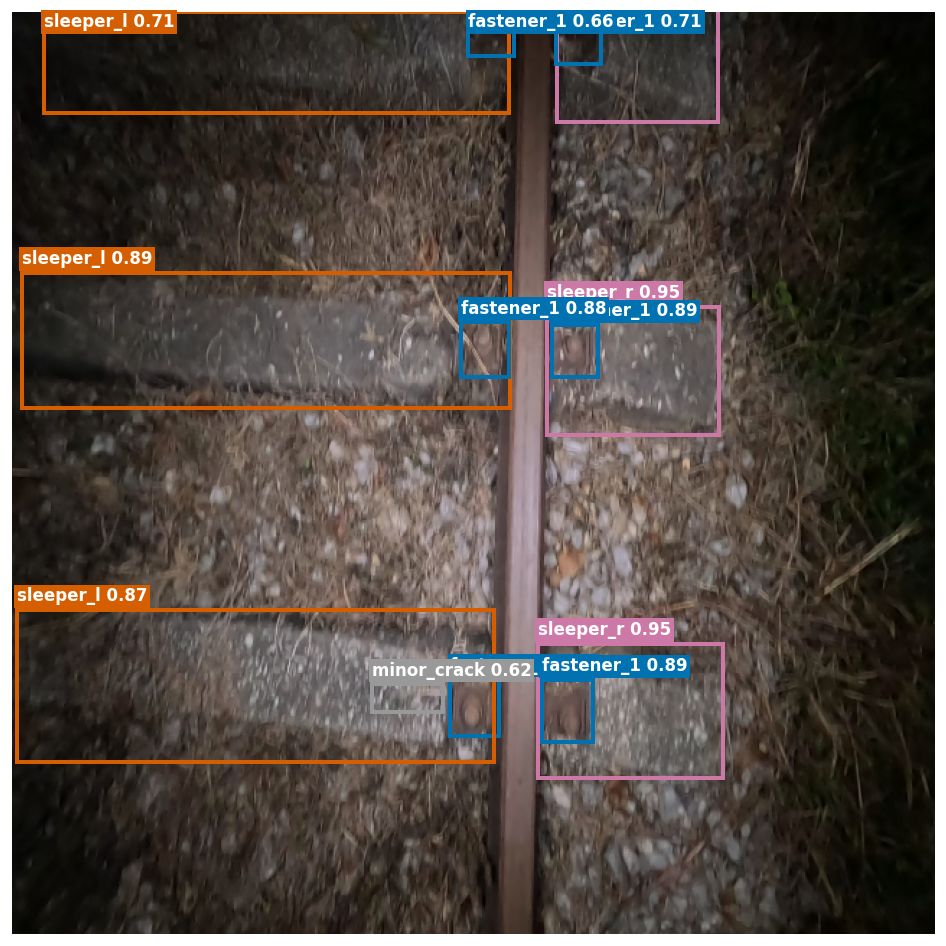

,class,score,x1,y1,x2,y2
0,sleeper_r,0.9519,364.6,438.0,493.2,531.3
1,sleeper_r,0.9471,370.9,204.1,490.5,293.0
2,sleeper_l,0.8943,6.1,180.6,345.2,274.7
3,fastener_1,0.8928,303.8,462.7,337.6,502.3
4,fastener_1,0.8892,367.3,463.2,402.4,506.3
5,fastener_1,0.8855,373.9,216.8,406.0,252.9
6,fastener_1,0.8832,310.8,214.9,344.5,253.2
7,sleeper_l,0.8743,2.6,414.5,333.8,520.2
8,sleeper_r,0.8278,377.5,-3.1,489.2,75.8
9,sleeper_l,0.7069,21.7,-0.3,344.5,70.0


In [7]:
def run_pipeline(tensor: torch.Tensor, raw: np.ndarray) -> pd.DataFrame:
    step_input(raw)
    night = step_night(tensor)
    step_retinex(tensor)
    step_retinex(night)
    step_detector_reflectance(tensor, raw)
    step_gradcam(tensor, raw)
    return step_predictions(
        tensor, raw, list(exp3["names"]), CLASS_COLOR,
        float(exp3["score_thr_cm"]), float(exp3["nms_iou_thr"]),
    )


day_predictions = run_pipeline(day_tensor, day_raw)
display(day_predictions)

night_predictions = run_pipeline(night_tensor, night_raw)
display(night_predictions)

## ***4. Reflectance encoder domain gap — day vs night (t-SNE)***

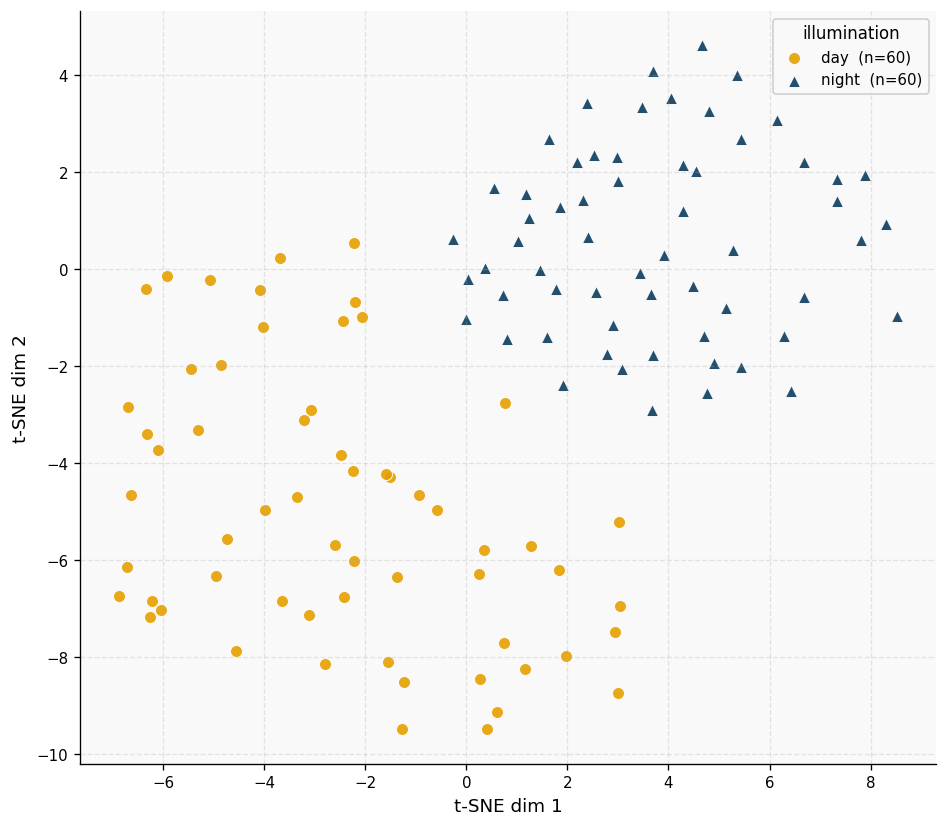

In [8]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

TSNE_PER_DOMAIN = 60
DOMAIN_STYLE = {"day": ("#E69F00", "o"), "night": ("#0B3C5D", "^")}


def sample_paths(image_paths: Sequence[str], count: int, seed: int = 43) -> "list[str]":
    rng = np.random.default_rng(seed)
    chosen = rng.choice(len(image_paths), size=min(count, len(image_paths)), replace=False)
    return [image_paths[int(i)] for i in chosen]


def reflectance_embeddings(
    image_paths: Sequence[str], device: str, batch_size: int = 16
) -> np.ndarray:
    feats, batch = [], []
    for path in image_paths:
        tensor, _ = load_sample(path, device)
        batch.append(tensor)
        if len(batch) == batch_size:
            with torch.no_grad():
                feats.append(detector.embed_reflectance(torch.cat(batch, 0)).cpu().numpy())
            batch = []
    if batch:
        with torch.no_grad():
            feats.append(detector.embed_reflectance(torch.cat(batch, 0)).cpu().numpy())
    return np.concatenate(feats, 0)


day_paths = sample_paths(SOURCE_IMAGES, TSNE_PER_DOMAIN)
night_paths = sample_paths(TARGET_IMAGES, TSNE_PER_DOMAIN)

features = np.concatenate(
    [reflectance_embeddings(day_paths, DEVICE), reflectance_embeddings(night_paths, DEVICE)], 0
)
domains = np.array(["day"] * len(day_paths) + ["night"] * len(night_paths))

scaled = StandardScaler().fit_transform(features)
projection = TSNE(
    n_components=2, perplexity=30, init="pca", learning_rate="auto", random_state=43
).fit_transform(scaled)

fig, ax = plt.subplots(figsize=(8.0, 7.0))
fig.patch.set_facecolor("white")
for name, (color, marker) in DOMAIN_STYLE.items():
    mask = domains == name
    ax.scatter(
        projection[mask, 0], projection[mask, 1], s=52, c=color, marker=marker,
        edgecolor="white", linewidth=0.6, alpha=0.9, label=f"{name}  (n={int(mask.sum())})",
    )
ax.set_xlabel("t-SNE dim 1")
ax.set_ylabel("t-SNE dim 2")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(title="illumination", loc="best", framealpha=0.92)
finish()